# **Welcome to my notebook!!**

### Thank you so much for opening this notebook. This notebook is specially for the beginners to machine learning.

Objective is to predict the quality of wine which is dependent on several factors.

In this notebook, I have done Exploratory Data Analysis (EDA) which includes, Profile Report, Bivariate Analysis, Visualization using seaborn, Correlation etc. Then I have done label encoding to Convert the labels into a numeric form so as to convert them into the machine-readable form. Finally I have build the model using various classifiers to predict the wine quality.

The following are the classifier models I have used here: 

1. Logistic Regression
2. Random Forest Classifier
3. Support Vector Classifier
4. Decision Tree Classifier
5. Gaussian Naive Bayes
6. K-Nearest Neighbor

In the end, I have done cross validation (Statistical Method) to evaluate and compare learning algorithms.

# **Import Libraries**

In [1]:
import numpy as np
import pandas as pd
import sklearn
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
import statsmodels.api as sm
from pandas_profiling import ProfileReport
%matplotlib inline

# **Import Dataset**

In [2]:
wine = pd.read_csv('../input/wine-quality/winequality.csv')

In [3]:
wine.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5


# **Exploratory Data Analysis (EDA)**

### Profile Report

In [4]:
# Profile Report to automate the EDA and widget is used for a better UI - better understanding in a structured & attractive way

ProfileReport(wine).to_widgets()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render widgets:   0%|          | 0/1 [00:00<?, ?it/s]

#### Below is the detail analysis I have done for beginners 

In [5]:
wine.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1599 entries, 0 to 1598
Data columns (total 12 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   fixed acidity         1599 non-null   float64
 1   volatile acidity      1599 non-null   float64
 2   citric acid           1599 non-null   float64
 3   residual sugar        1599 non-null   float64
 4   chlorides             1599 non-null   float64
 5   free sulfur dioxide   1599 non-null   float64
 6   total sulfur dioxide  1599 non-null   float64
 7   density               1599 non-null   float64
 8   pH                    1599 non-null   float64
 9   sulphates             1599 non-null   float64
 10  alcohol               1599 non-null   float64
 11  quality               1599 non-null   int64  
dtypes: float64(11), int64(1)
memory usage: 150.0 KB


In [6]:
wine.describe().T

,count,mean,std,min,25%,50%,75%,max
fixed acidity,1599.0,8.319637,1.741096,4.60000,7.1000,7.90000,9.200000,15.90000
volatile acidity,1599.0,0.527821,0.179060,0.12000,0.3900,0.52000,0.640000,1.58000
citric acid,1599.0,0.270976,0.194801,0.00000,0.0900,0.26000,0.420000,1.00000
residual sugar,1599.0,2.538806,1.409928,0.90000,1.9000,2.20000,2.600000,15.50000
chlorides,1599.0,0.087467,0.047065,0.01200,0.0700,0.07900,0.090000,0.61100
free sulfur dioxide,1599.0,15.874922,10.460157,1.00000,7.0000,14.00000,21.000000,72.00000
total sulfur dioxide,1599.0,46.467792,32.895324,6.00000,22.0000,38.00000,62.000000,289.00000
density,1599.0,0.996747,0.001887,0.99007,0.9956,0.99675,0.997835,1.00369
pH,1599.0,3.311113,0.154386,2.74000,3.2100,3.31000,3.400000,4.01000
sulphates,1599.0,0.658149,0.169507,0.33000,0.5500,0.62000,0.730000,2.00000


In [7]:
wine.columns

Index(['fixed acidity', 'volatile acidity', 'citric acid', 'residual sugar',
       'chlorides', 'free sulfur dioxide', 'total sulfur dioxide', 'density',
       'pH', 'sulphates', 'alcohol', 'quality'],
      dtype='object')

In [8]:
wine['quality'].unique()

array([5, 6, 7, 4, 8, 3])

In [9]:
pd.DataFrame(wine['quality'].value_counts())

,quality
5,681
6,638
7,199
4,53
8,18
3,10


In [10]:
# Average quality of wine

print('Average Wine Quality =', wine['quality'].mean())

Average Wine Quality = 5.6360225140712945


<AxesSubplot:xlabel='alcohol', ylabel='pH'>

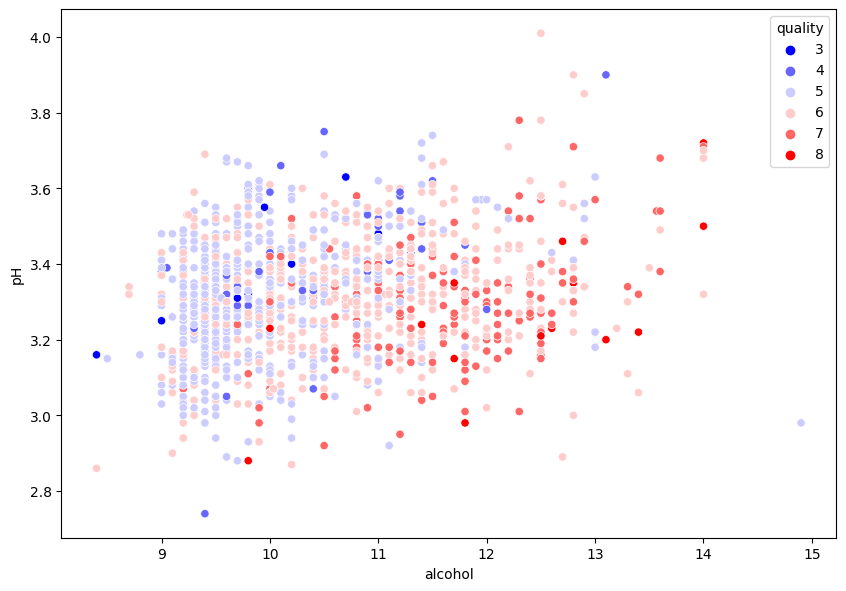

In [11]:
# Scatter Plot to get idea about alcohol and pH relationship

plt.figure(figsize=(10,7), dpi=100)
sns.scatterplot(data=wine, x='alcohol', y='pH', hue='quality', palette='bwr')

<AxesSubplot:xlabel='quality', ylabel='fixed acidity'>

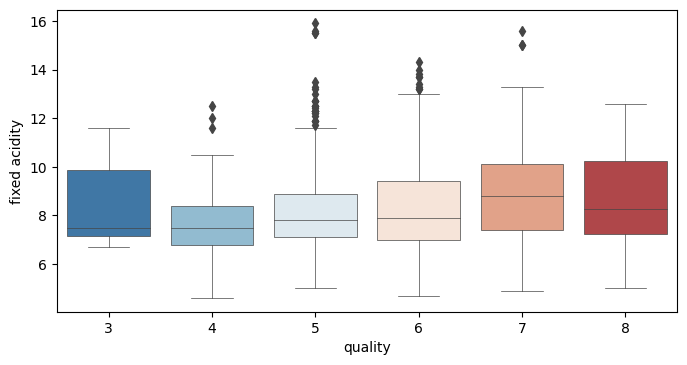

In [12]:
plt.figure(figsize=(8,4), dpi=100)
sns.boxplot(data=wine, x='quality', y='fixed acidity', linewidth=0.5, palette='RdBu_r')

<AxesSubplot:xlabel='quality', ylabel='volatile acidity'>

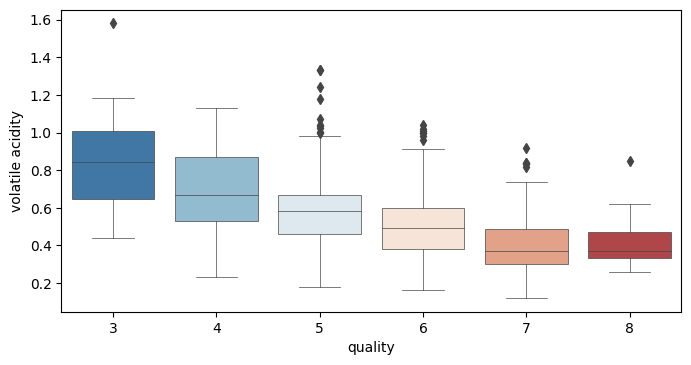

In [13]:
plt.figure(figsize=(8,4), dpi=100)
sns.boxplot(data=wine, x='quality', y='volatile acidity', linewidth=0.5, palette='RdBu_r')

<AxesSubplot:xlabel='quality', ylabel='citric acid'>

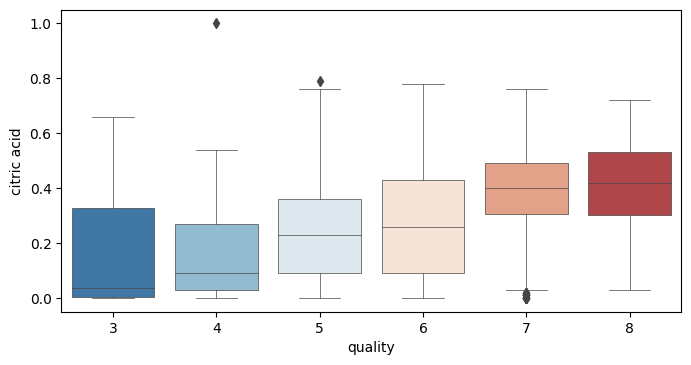

In [14]:
plt.figure(figsize=(8,4), dpi=100)
sns.boxplot(data=wine, x='quality', y='citric acid', linewidth=0.5, palette='RdBu_r')

<AxesSubplot:xlabel='quality', ylabel='residual sugar'>

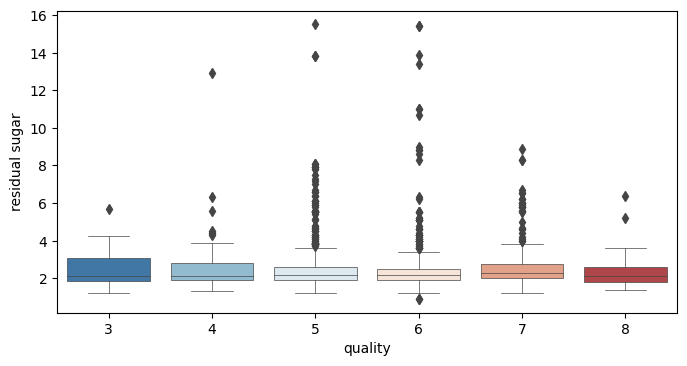

In [15]:
plt.figure(figsize=(8,4), dpi=100)
sns.boxplot(data=wine, x='quality', y='residual sugar', linewidth=0.5, palette='RdBu_r')

<AxesSubplot:xlabel='quality', ylabel='chlorides'>

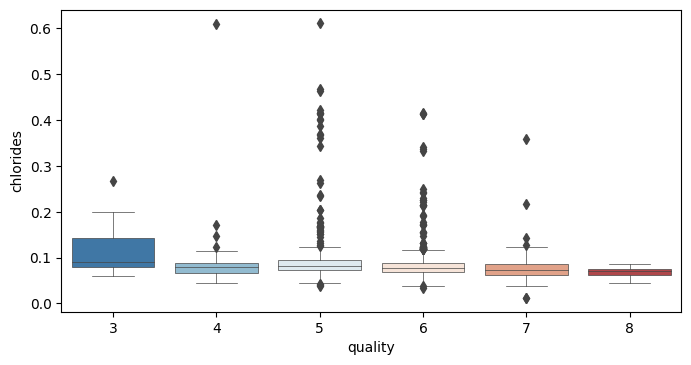

In [16]:
plt.figure(figsize=(8,4), dpi=100)
sns.boxplot(data=wine, x='quality', y='chlorides', linewidth=0.5, palette='RdBu_r')

<AxesSubplot:xlabel='quality', ylabel='density'>

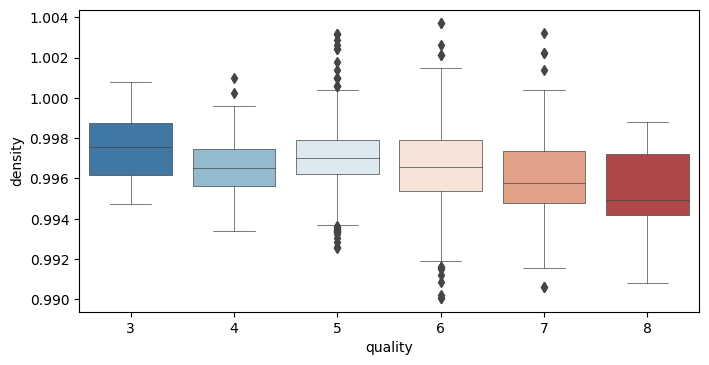

In [17]:
plt.figure(figsize=(8,4), dpi=100)
sns.boxplot(data=wine, x='quality', y='density', linewidth=0.5, palette='RdBu_r')

<AxesSubplot:xlabel='quality', ylabel='pH'>

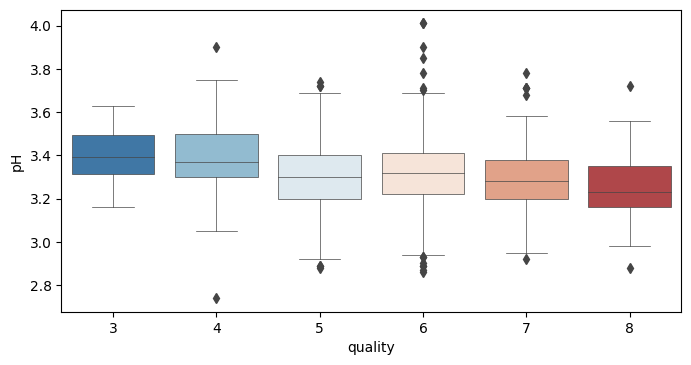

In [18]:
plt.figure(figsize=(8,4), dpi=100)
sns.boxplot(data=wine, x='quality', y='pH', linewidth=0.5, palette='RdBu_r')

<AxesSubplot:xlabel='quality', ylabel='alcohol'>

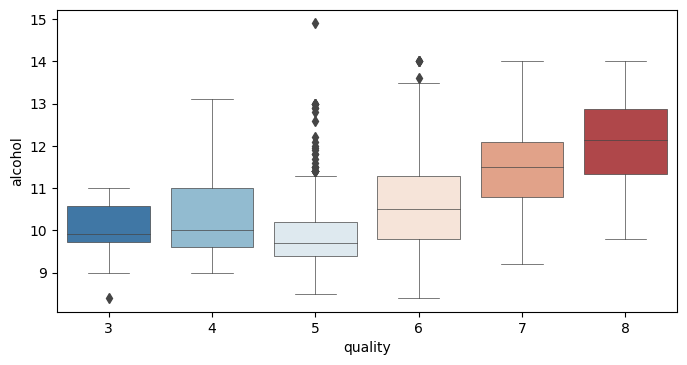

In [19]:
plt.figure(figsize=(8,4), dpi=100)
sns.boxplot(data=wine, x='quality', y='alcohol', linewidth=0.5, palette='RdBu_r')

<AxesSubplot:>

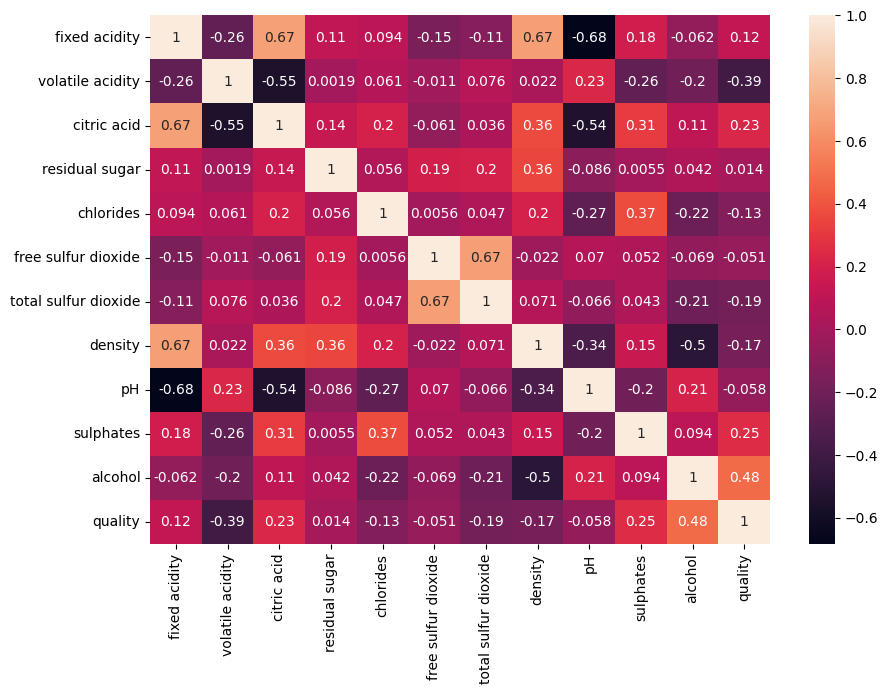

In [20]:
# Correlation Plot

plt.figure(figsize=(10,7), dpi=100)
sns.heatmap(wine.corr(), annot=True)

# **Preprocessing data for ML algorithm**

In [21]:
# Here, dividing wine as bad and good quality

bins = (2, 6, 8)
group_names = ['bad', 'good']
wine['quality'] = pd.cut(wine['quality'], bins = bins, labels = group_names)
wine.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,bad
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,bad
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,bad
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,bad
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,bad


In [22]:
# Import Label Encoder to encode levels of categorical features into numeric values

from sklearn.preprocessing import StandardScaler, LabelEncoder
label_quality = LabelEncoder()

In [23]:
wine['quality'] = label_quality.fit_transform(wine['quality'])

In [24]:
wine.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,0
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,0
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,0
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,0
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,0


In [25]:
wine['quality'].value_counts()

0    1382
1     217
Name: quality, dtype: int64

# **Machine Learning Algorithm**

### Model Building

In [26]:
x = wine.drop(['quality'], axis=1)

In [27]:
y = wine['quality']

In [28]:
# Train and Test Dataset

from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2)

### Logistic Regression

In [29]:
# Applying Standard scaling to get optimized result

sc = StandardScaler()
x_train = sc.fit_transform(x_train)
x_test = sc.fit_transform(x_test)

In [30]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix, accuracy_score, classification_report

log_reg = LogisticRegression()
log_reg.fit(x_train, y_train)
log_reg_pred_y = log_reg.predict(x_test)
print(classification_report(y_test, log_reg_pred_y))

print('Confusion Matrix\n', confusion_matrix(y_test, log_reg_pred_y))

log_reg_acc = accuracy_score(y_test, log_reg_pred_y)
print('\nAccuracy Score =', log_reg_acc*100, '%')

              precision    recall  f1-score   support

           0       0.91      0.97      0.94       278
           1       0.65      0.36      0.46        42

    accuracy                           0.89       320
   macro avg       0.78      0.66      0.70       320
weighted avg       0.88      0.89      0.88       320

Confusion Matrix
 [[270   8]
 [ 27  15]]

Accuracy Score = 89.0625 %


### Random Forest Classifier

In [31]:
from sklearn.ensemble import RandomForestClassifier

rfc = RandomForestClassifier()
rfc.fit(x_train, y_train)
rfc_pred_y = rfc.predict(x_test)
print(classification_report(y_test, rfc_pred_y))
print('Confusion Matrix\n', confusion_matrix(y_test, rfc_pred_y))

rfc_acc = accuracy_score(y_test, rfc_pred_y)
print('\nAccuracy Score =', rfc_acc*100, '%')

              precision    recall  f1-score   support

           0       0.91      0.97      0.94       278
           1       0.62      0.36      0.45        42

    accuracy                           0.89       320
   macro avg       0.77      0.66      0.70       320
weighted avg       0.87      0.89      0.87       320

Confusion Matrix
 [[269   9]
 [ 27  15]]

Accuracy Score = 88.75 %


### Support Vector Classifier

In [32]:
from sklearn.svm import SVC

svc = SVC()
svc.fit(x_train,y_train)
svc_pred_y = svc.predict(x_test)
print(classification_report(y_test, svc_pred_y))
print('Confusion Matrix\n', confusion_matrix(y_test, svc_pred_y))

svc_acc = accuracy_score(y_test, svc_pred_y)
print('\nAccuracy Score =', svc_acc*100, '%')

              precision    recall  f1-score   support

           0       0.90      0.98      0.94       278
           1       0.71      0.29      0.41        42

    accuracy                           0.89       320
   macro avg       0.80      0.63      0.67       320
weighted avg       0.88      0.89      0.87       320

Confusion Matrix
 [[273   5]
 [ 30  12]]

Accuracy Score = 89.0625 %


### Decision Tree Classifier

In [33]:
from sklearn.tree import DecisionTreeClassifier

dtc = DecisionTreeClassifier()
dtc.fit(x_train, y_train)
dtc_pred_y = dtc.predict(x_test)
print(classification_report(y_test, dtc_pred_y))
print('Confusion Matrix\n', confusion_matrix(y_test, dtc_pred_y))

dtc_acc = accuracy_score(y_test, dtc_pred_y)
print('\nAccuracy Score =', dtc_acc*100, '%')

              precision    recall  f1-score   support

           0       0.93      0.86      0.90       278
           1       0.39      0.57      0.46        42

    accuracy                           0.82       320
   macro avg       0.66      0.72      0.68       320
weighted avg       0.86      0.82      0.84       320

Confusion Matrix
 [[240  38]
 [ 18  24]]

Accuracy Score = 82.5 %


### Gaussian Naive Bayes

In [34]:
from sklearn.naive_bayes import GaussianNB

gnb = GaussianNB()
gnb.fit(x_train, y_train)
gnb_pred_y = gnb.predict(x_test)
print(classification_report(y_test, gnb_pred_y))
print('Confusion Matrix\n', confusion_matrix(y_test, gnb_pred_y))

gnb_acc = accuracy_score(y_test, gnb_pred_y)
print('\nAccuracy Score =', gnb_acc*100, '%')

              precision    recall  f1-score   support

           0       0.94      0.86      0.90       278
           1       0.42      0.64      0.50        42

    accuracy                           0.83       320
   macro avg       0.68      0.75      0.70       320
weighted avg       0.87      0.83      0.85       320

Confusion Matrix
 [[240  38]
 [ 15  27]]

Accuracy Score = 83.4375 %


### KNeighbors Classifier 

In [35]:
from sklearn.neighbors import KNeighborsClassifier

knn = KNeighborsClassifier()
knn.fit(x_train, y_train)
knn_pred_y = knn.predict(x_test)
print(classification_report(y_test, knn_pred_y))
print('Confusion Matrix\n', confusion_matrix(y_test, knn_pred_y))

knn_acc = accuracy_score(y_test, knn_pred_y)
print('\nAccuracy Score =', knn_acc*100, '%')

              precision    recall  f1-score   support

           0       0.91      0.92      0.92       278
           1       0.45      0.40      0.43        42

    accuracy                           0.86       320
   macro avg       0.68      0.66      0.67       320
weighted avg       0.85      0.86      0.85       320

Confusion Matrix
 [[257  21]
 [ 25  17]]

Accuracy Score = 85.625 %


# **Cross Validation**

In [36]:
from sklearn.model_selection import cross_val_score

### Logistic Regression

In [37]:
log_reg_scores = cross_val_score(log_reg, x_train, y_train, cv=10)
print(log_reg_scores)
print("Mean Score =", log_reg_scores.mean().round(5)*100,'%')

[0.8671875  0.8828125  0.875      0.875      0.8671875  0.859375
 0.875      0.8671875  0.84375    0.91338583]
Mean Score = 87.259 %


### Random Forest Classifier

In [38]:
rfc_scores = cross_val_score(rfc, x_train, y_train, cv=10)
print(rfc_scores)
print('Mean Score =', rfc_scores.mean().round(5)*100,'%')

[0.90625    0.9296875  0.9296875  0.921875   0.921875   0.8984375
 0.8671875  0.9140625  0.8984375  0.93700787]
Mean Score = 91.245 %


### Support Vector Classifier

In [39]:
svc_scores = cross_val_score(svc, x_train, y_train, cv=10)
print(svc_scores)
print('Mean Scores =', svc_scores.mean().round(5)*100, '%')

[0.8984375 0.90625   0.875     0.90625   0.875     0.859375  0.84375
 0.8984375 0.8671875 0.8976378]
Mean Scores = 88.273 %


### Decision Tree Classifier

In [40]:
dtc_scores = cross_val_score(dtc, x_train, y_train, cv=10)
print(dtc_scores)
print('Mean Score =', dtc_scores.mean().round(5)*100, '%')

[0.859375   0.9296875  0.875      0.84375    0.9296875  0.859375
 0.8046875  0.8828125  0.8828125  0.83464567]
Mean Score = 87.018 %


### Gussian Naive Bayes

In [41]:
gnb_scores = cross_val_score(gnb, x_train, y_train, cv=10)
print(gnb_scores)
print('Mean Score =', gnb_scores.mean().round(5)*100, '%')

[0.8046875  0.8203125  0.8515625  0.8515625  0.859375   0.796875
 0.84375    0.8515625  0.8515625  0.85826772]
Mean Score = 83.895 %


### KNearest Neighbor

In [42]:
knn_scores = cross_val_score(knn, x_train, y_train, cv=10)
print(knn_scores)
print('Mean Score =', knn_scores.mean().round(5)*100, '%')

[0.8828125  0.875      0.890625   0.859375   0.875      0.859375
 0.84375    0.8828125  0.875      0.87401575]
Mean Score = 87.178 %


# **Summary**

In [43]:
result = pd.DataFrame([{'Algorithm':'Logistic Regression', 'Accuracy Score (%)':log_reg_acc*100, 'Cross Validation Score (%)':log_reg_scores.mean().round(5)*100},
                       {'Algorithm':'Random Forest Classifier', 'Accuracy Score (%)':rfc_acc*100, 'Cross Validation Score (%)':rfc_scores.mean().round(5)*100},
                       {'Algorithm':'Support Vector Classifier', 'Accuracy Score (%)':svc_acc*100, 'Cross Validation Score (%)':svc_scores.mean().round(5)*100},
                       {'Algorithm':'Decision Tree Classifier', 'Accuracy Score (%)':dtc_acc*100, 'Cross Validation Score (%)':dtc_scores.mean().round(5)*100},
                       {'Algorithm':'Gaussian Naive Bayes', 'Accuracy Score (%)':gnb_acc*100, 'Cross Validation Score (%)':gnb_scores.mean().round(5)*100},
                       {'Algorithm':'K-Nearest Neighbor', 'Accuracy Score (%)':knn_acc*100, 'Cross Validation Score (%)':knn_scores.mean().round(5)*100}])
result.set_index(['Algorithm']).sort_values(by = ['Cross Validation Score (%)'], ascending = False)

,Accuracy Score (%),Cross Validation Score (%)
Algorithm,,
Random Forest Classifier,88.7500,91.245
Support Vector Classifier,89.0625,88.273
Logistic Regression,89.0625,87.259
K-Nearest Neighbor,85.6250,87.178
Decision Tree Classifier,82.5000,87.018
Gaussian Naive Bayes,83.4375,83.895


### Here, I have managed to increase the score of Random Forest Classifier from **89%** to **91%** by cross validation.

### Thank you!!